In [2]:
import numpy as np
import pandas as pd
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn.metrics import accuracy_score
from skimage.feature import graycomatrix, graycoprops
import os


Successfully loaded 15 images.


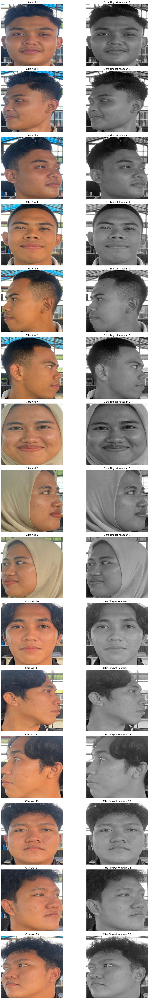

In [3]:
def rgb_to_grayscale(image):
    """Konversi RGB ke tingkat keabuan."""
    width, height = image.size
    grayscale_image = Image.new("L", (width, height))

    for y in range(height):
        for x in range(width):
            # Dapatkan nilai RGB dari setiap piksel
            r, g, b = image.getpixel((x, y))

            # Hitung tingkat keabuan
            gray_value = int((r + g + b) / 3)

            # Set nilai tingkat keabuan pada piksel citra baru
            grayscale_image.putpixel((x, y), gray_value)

    return grayscale_image

def load_images_from_folder(folder_path, target_size=(256, 256), max_images=15):
    # List untuk menyimpan gambar asli dan gambar grayscale dalam bentuk array
    original_images = []
    grayscale_images = []
    filenames = []
    
    # Mendapatkan semua file gambar dari folder dan subfolder
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
                try:
                    image_path = os.path.join(root, file)
                    image = Image.open(image_path).resize(target_size)
                    grayscale_image = rgb_to_grayscale(image)
                    
                    original_images.append(np.array(image))
                    grayscale_images.append(np.array(grayscale_image))
                    filenames.append(file)
                    
                    # Berhenti jika sudah mencapai batas max_images
                    if len(original_images) >= max_images:
                        return original_images, grayscale_images, filenames
                except Exception as e:
                    print(f"Failed to process {file}: {e}")
    
    return original_images, grayscale_images, filenames

# Path ke folder yang berisi gambar-gambar
folder_path = 'Data2'  # Ganti dengan path yang benar

# Memuat gambar dari folder dan subfolder
original_images, grayscale_images, filenames = load_images_from_folder(folder_path)

# Memeriksa apakah ada gambar yang berhasil dimuat
if original_images and grayscale_images:
    # Mengubah list menjadi array numpy 4D
    print(f"Successfully loaded {len(original_images)} images.")
    
    # Menampilkan gambar-gambar asli dan grayscale yang telah dimuat
    fig, axes = plt.subplots(len(original_images), 2, figsize=(15, len(original_images) * 5))
    
    for i, (orig_img, gray_img) in enumerate(zip(original_images, grayscale_images)):
        # Tampilkan gambar asli
        axes[i, 0].imshow(orig_img)
        axes[i, 0].set_title(f'Citra Asli {i+1}')
        axes[i, 0].axis('off')
        
        # Tampilkan gambar grayscale
        axes[i, 1].imshow(gray_img, cmap='gray')
        axes[i, 1].set_title(f'Citra Tingkat Keabuan {i+1}')
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print("No images were loaded.")


In [4]:
# Fungsi untuk memuat gambar dari folder
def load_images_from_folder(folder_path):
    original_images = []
    grayscale_images = []
    filenames = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.endswith(('jpg', 'png', 'jpeg')):
                img_path = os.path.join(root, file)
                img = cv2.imread(img_path)
                if img is not None:
                    original_images.append(img)
                    grayscale_images.append(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY))
                    filenames.append(file)
    return original_images, grayscale_images, filenames

# Path ke folder yang berisi gambar-gambar
folder_path = 'Data2'  # Ganti dengan path yang benar

# Memuat gambar dari folder dan subfolder
original_images, grayscale_images, filenames = load_images_from_folder(folder_path)

# Memeriksa apakah ada gambar yang berhasil dimuat
if not original_images or not grayscale_images:
    print("No images were loaded.")
    exit()

# Menampilkan daftar gambar yang dimuat
print(f"Loaded {len(original_images)} images.")
for filename in filenames:
    print(filename)


Loaded 15 images.
1.jpg
2.jpg
3.jpg
1.jpg
2.jpg
3.jpg
1.jpg
2.jpg
3.jpg
1.jpg
2.jpg
3.jpg
1.jpg
2.jpg
3.jpg


Processing folder: Jevon
Processing folder: Kevin
Processing folder: Lita
Processing folder: Rama
Processing folder: Yogi
Features extracted successfully:
Image 1 features:
  Red Mean: 98.91987029916636
  Green Mean: 101.834160395237
  Blue Mean: 126.37376296734475
  Red Std Deviation: 41.01320094987587
  Green Std Deviation: 42.79698415001105
  Blue Std Deviation: 60.6944769843491
  Contrast: 319.1646044992942
  Dissimilarity: 4.345022665378292

Image 2 features:
  Red Mean: 100.90291473765772
  Green Mean: 103.93849381099213
  Blue Mean: 124.9933865072039
  Red Std Deviation: 46.20153241816805
  Green Std Deviation: 47.46860014177216
  Blue Std Deviation: 66.85674841791027
  Contrast: 270.00533258415646
  Dissimilarity: 4.202086916881127

Image 3 features:
  Red Mean: 92.59527896995708
  Green Mean: 93.59948214095698
  Blue Mean: 112.7348277941333
  Red Std Deviation: 46.21062842763449
  Green Std Deviation: 45.71006529477533
  Blue Std Deviation: 64.26241664107373
  Contrast: 305.38

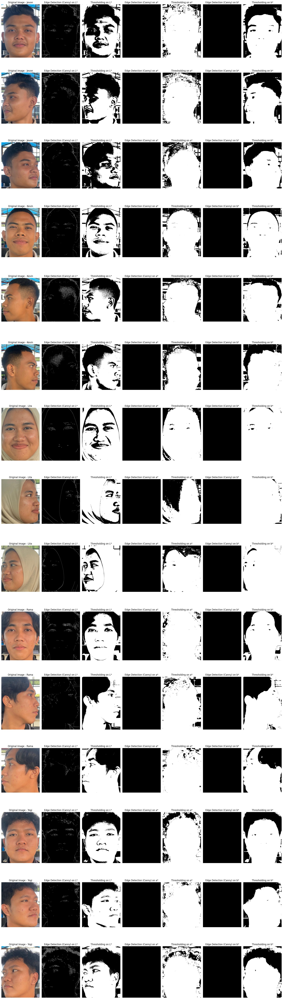

In [5]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import graycomatrix, graycoprops

# Path ke folder yang berisi gambar-gambar
folder_path = 'Data2'  # Ganti dengan path yang benar

# Akuisisi Citra
folders = ["Jevon", "Kevin", "Lita", "Rama", "Yogi"]

# Menyiapkan plot untuk menampilkan seluruh gambar
total_images = sum([len(os.listdir(os.path.join(folder_path, folder))) for folder in folders])
fig, axes = plt.subplots(total_images, 7, figsize=(21, 5 * total_images))

image_index = 0
final = []

# Proses Segmentasi dan Ekstraksi Fitur
for folder in folders:
    print(f"Processing folder: {folder}")
    INPUT_SCAN_FOLDER = os.path.join(folder_path, folder)
    
    image_folder_list = os.listdir(INPUT_SCAN_FOLDER)
    for i in range(len(image_folder_list)):
        img_path = os.path.join(INPUT_SCAN_FOLDER, image_folder_list[i])
        img = cv2.imread(img_path)
        if img is None:
            print(f"Failed to load image: {img_path}")
            continue
        
        # Akuisisi Citra (Pemrosesan gambar)
        lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        c1 = lab[:, :, 0]
        c2 = lab[:, :, 1]
        c3 = lab[:, :, 2]

        # Segmentasi dengan deteksi tepi dan thresholding pada masing-masing channel
        edges_c1 = cv2.Canny(c1, 100, 200)
        _, thresholded_c1 = cv2.threshold(c1, 127, 255, cv2.THRESH_BINARY)

        edges_c2 = cv2.Canny(c2, 100, 200)
        _, thresholded_c2 = cv2.threshold(c2, 127, 255, cv2.THRESH_BINARY)

        edges_c3 = cv2.Canny(c3, 100, 200)
        _, thresholded_c3 = cv2.threshold(c3, 127, 255, cv2.THRESH_BINARY)

        # Menampilkan hasil menggunakan matplotlib
        axes[image_index][0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[image_index][0].set_title(f'Original Image - {folder}')
        axes[image_index][0].axis('off')

        axes[image_index][1].imshow(edges_c1, cmap='gray')
        axes[image_index][1].set_title('Edge Detection (Canny) on L*')
        axes[image_index][1].axis('off')

        axes[image_index][2].imshow(thresholded_c1, cmap='gray')
        axes[image_index][2].set_title('Thresholding on L*')
        axes[image_index][2].axis('off')

        axes[image_index][3].imshow(edges_c2, cmap='gray')
        axes[image_index][3].set_title('Edge Detection (Canny) on a*')
        axes[image_index][3].axis('off')

        axes[image_index][4].imshow(thresholded_c2, cmap='gray')
        axes[image_index][4].set_title('Thresholding on a*')
        axes[image_index][4].axis('off')

        axes[image_index][5].imshow(edges_c3, cmap='gray')
        axes[image_index][5].set_title('Edge Detection (Canny) on b*')
        axes[image_index][5].axis('off')

        axes[image_index][6].imshow(thresholded_c3, cmap='gray')
        axes[image_index][6].set_title('Thresholding on b*')
        axes[image_index][6].axis('off')

        # Ekstraksi fitur dari gambar
        red_channel = img[:, :, 0]
        green_channel = img[:, :, 1]
        blue_channel = img[:, :, 2]
        blue_channel[blue_channel == 255] = 0
        green_channel[green_channel == 255] = 0
        red_channel[red_channel == 255] = 0
        
        red_mean = np.mean(red_channel)
        green_mean = np.mean(green_channel)
        blue_mean = np.mean(blue_channel)
        red_std = np.std(red_channel)
        green_std = np.std(green_channel)
        blue_std = np.std(blue_channel)
        
        # Segmentasi untuk GLCM
        segmented_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Menggunakan gambar dalam grayscale untuk GLCM
        glcmMatrix = graycomatrix(segmented_img, [1], [0], levels=256, symmetric=True, normed=True)
        
        proList = ['contrast', 'dissimilarity']
        properties = np.zeros(len(proList))
        for j in range(len(proList)):
            properties[j] = graycoprops(glcmMatrix, prop=proList[j])[0, 0]
        
        # Menyimpan fitur ke dalam array final
        features = np.array([red_mean, green_mean, blue_mean, red_std, green_std, blue_std, properties[0], properties[1]])
        final.append(features)
        
        image_index += 1

# Menampilkan hasil ekstraksi fitur
print("Features extracted successfully:")
for i, feature in enumerate(final):
    print(f"Image {i+1} features:")
    print(f"  Red Mean: {feature[0]}")
    print(f"  Green Mean: {feature[1]}")
    print(f"  Blue Mean: {feature[2]}")
    print(f"  Red Std Deviation: {feature[3]}")
    print(f"  Green Std Deviation: {feature[4]}")
    print(f"  Blue Std Deviation: {feature[5]}")
    print(f"  Contrast: {feature[6]}")
    print(f"  Dissimilarity: {feature[7]}")
    print()

plt.tight_layout()
plt.show()

In [6]:
import numpy as np
import os
import pandas as pd
import cv2
from skimage.feature import graycomatrix, graycoprops
from skimage.measure import label
import skimage
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Path ke folder yang berisi gambar-gambar
folder_path = 'Data2'  # Ganti dengan path yang benar

# Akuisisi Citra
folders = ["Jevon", "Kevin", "Lita", "Rama", "Yogi"]
featlist = ['Red Mean', 'Green Mean', 'Blue Mean', 'Red Std', 'Green Std', 'Blue Std', 'Contrast', 'Dissimilarity', 'Label']
final = []

# Akuisisi Citra
for folder in folders:
    print(f"Processing folder: {folder}")
    labell = folders.index(folder)
    INPUT_SCAN_FOLDER = os.path.join(folder_path, folder)
    
    image_folder_list = os.listdir(INPUT_SCAN_FOLDER)
    
    for image_filename in image_folder_list:
        img_path = os.path.join(INPUT_SCAN_FOLDER, image_filename)
        img = cv2.imread(img_path)
        if img is None:
            print(f"Failed to load image: {img_path}")
            continue
        
        # Akuisisi Citra (Pemrosesan gambar)
        lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        c1 = lab[:, :, 0]
        c2 = lab[:, :, 1]
        c3 = lab[:, :, 2]

        # Segmentasi
        edges_c1 = cv2.Canny(c1, 100, 200)
        _, thresholded_c1 = cv2.threshold(c1, 127, 255, cv2.THRESH_BINARY)

        edges_c2 = cv2.Canny(c2, 100, 200)
        _, thresholded_c2 = cv2.threshold(c2, 127, 255, cv2.THRESH_BINARY)

        edges_c3 = cv2.Canny(c3, 100, 200)
        _, thresholded_c3 = cv2.threshold(c3, 127, 255, cv2.THRESH_BINARY)

        # Ekstraksi fitur dari gambar
        red_channel = img[:, :, 0]
        green_channel = img[:, :, 1]
        blue_channel = img[:, :, 2]
        blue_channel[blue_channel == 255] = 0
        green_channel[green_channel == 255] = 0
        red_channel[red_channel == 255] = 0
        
        red_mean = np.mean(red_channel)
        green_mean = np.mean(green_channel)
        blue_mean = np.mean(blue_channel)
        red_std = np.std(red_channel)
        green_std = np.std(green_channel)
        blue_std = np.std(blue_channel)
        
        # Segmentasi untuk GLCM
        segmented_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Menggunakan gambar dalam grayscale untuk GLCM
        glcmMatrix = graycomatrix(segmented_img, [1], [0], levels=256, symmetric=True, normed=True)
        
        proList = ['contrast', 'dissimilarity']
        properties = np.zeros(len(proList))
        for j in range(len(proList)):
            properties[j] = graycoprops(glcmMatrix, prop=proList[j])[0, 0]
        
        # Menyimpan fitur ke dalam array final
        features = np.array([red_mean, green_mean, blue_mean, red_std, green_std, blue_std, properties[0], properties[1], labell])
        final.append(features)

# Membuat DataFrame dari fitur-fitur yang diekstraksi
df = pd.DataFrame(final, columns=featlist)

# Memisahkan fitur dan label
X = df.drop('Label', axis=1)
y = df['Label']

# Membagi data menjadi training dan testing dengan stratifikasi
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42, stratify=y)

# Simpan data training ke CSV
train_df = pd.concat([X_train, y_train], axis=1)
train_df.to_csv("Training_split3.csv", index=False)

# Simpan data testing ke CSV
test_df = pd.concat([X_test, y_test], axis=1)
test_df.to_csv("Testing_split3.csv", index=False)

print("Data training dan testing telah dibagi dan disimpan ke dalam CSV.")


Processing folder: Jevon
Processing folder: Kevin
Processing folder: Lita
Processing folder: Rama
Processing folder: Yogi
Data training dan testing telah dibagi dan disimpan ke dalam CSV.


In [1]:
import numpy as np
import pandas as pd
import cv2
from sklearn import svm
from sklearn.metrics import accuracy_score
from skimage.feature import graycomatrix, graycoprops
import os

# Function to load and split data
def load_data(training_data_path, testing_data_path):
    train = pd.read_csv(training_data_path)
    test = pd.read_csv(testing_data_path)
    return train, test

# Function to train the classifier
def train_classifier(train):
    print("Columns in training data:", train.columns)
    columns = ['Red Mean', 'Green Mean', 'Blue Mean', 'Red Std', 'Green Std', 'Blue Std', 'Contrast', 'Dissimilarity']
    missing_columns = [col for col in columns if col not in train.columns]
    if missing_columns:
        raise ValueError(f"Missing columns in training data: {missing_columns}")
    X_train = train[columns]
    y_train = train['Label']
    
    print(f"Training data contains {len(set(y_train))} unique classes.")
    
    clf = svm.SVC(kernel="rbf", C=50)
    clf.fit(X_train, y_train)
    return clf

# Function to evaluate the classifier
def evaluate_classifier(clf, test):
    columns = ['Red Mean', 'Green Mean', 'Blue Mean', 'Red Std', 'Green Std', 'Blue Std', 'Contrast', 'Dissimilarity']
    X_test = test[columns]
    y_test = test['Label']
    y_pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"Model Accuracy: {accuracy * 100:.2f}%")

# Function to extract features from frame
def extract_features_from_frame(frame):
    lab = cv2.cvtColor(frame, cv2.COLOR_BGR2LAB)
    c1 = lab[:, :, 0]
    c2 = lab[:, :, 1]
    c3 = lab[:, :, 2]

    low = np.array([30])
    up = np.array([126])
    mask = cv2.inRange(c2, low, up)
    frame[mask > 0] = (255, 255, 255)

    red_channel = frame[:, :, 0]
    green_channel = frame[:, :, 1]
    blue_channel = frame[:, :, 2]
    blue_channel[blue_channel == 255] = 0
    green_channel[green_channel == 255] = 0
    red_channel[red_channel == 255] = 0

    red_mean = np.mean(red_channel)
    green_mean = np.mean(green_channel)
    blue_mean = np.mean(blue_channel)
    red_std = np.std(red_channel)
    green_std = np.std(green_channel)
    blue_std = np.std(blue_channel)

    gray_image = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    glcmMatrix = graycomatrix(gray_image, [1], [0], levels=256, symmetric=True, normed=True)

    properties = []
    for prop in ['contrast', 'dissimilarity']:
        properties.append(graycoprops(glcmMatrix, prop=prop)[0, 0])

    features = [red_mean, green_mean, blue_mean, red_std, green_std, blue_std, properties[0], properties[1]]
    return features

# Function to ensure path exists
def assure_path_exists(path):
    dir = os.path.dirname(path)
    if not os.path.exists(dir):
        os.makedirs(dir)

# Load data
training_data_path = "Training_split3.csv"
testing_data_path = "Testing_split3.csv"
train, test = load_data(training_data_path, testing_data_path)

# Train classifier
clf = train_classifier(train)

# Evaluate classifier
evaluate_classifier(clf, test)

# List of names corresponding to labels
names = ["Yogi", "Jevon", "Lita", "Rama", "Kevin"]

# Initialize camera
cap = cv2.VideoCapture(0)

# Set camera properties
cap.set(cv2.CAP_PROP_FRAME_WIDTH, 640)
cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 480)
cap.set(cv2.CAP_PROP_FOCUS, 0)

# Load Haar Cascade for face detection
faceCascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

try:
    while True:
        ret, frame = cap.read()
        if not ret:
            break

        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        faces = faceCascade.detectMultiScale(gray, 1.2, 5)

        for (x, y, w, h) in faces:
            cv2.rectangle(frame, (x-20, y-20), (x+w+20, y+h+20), (252, 192, 203), 2)

            # Extract features from frame for SVM classification
            face_region = frame[y:y+h, x:x+w]
            features = extract_features_from_frame(face_region)

            # Convert features to DataFrame with correct column names
            feature_columns = ['Red Mean', 'Green Mean', 'Blue Mean', 'Red Std', 'Green Std', 'Blue Std', 'Contrast', 'Dissimilarity']
            features_df = pd.DataFrame([features], columns=feature_columns)

            # Debugging: print extracted features
            print("Extracted features:", features)

            # Predict using SVM classifier
            prediction = clf.predict(features_df)[0]

            # Debugging: print prediction
            print("Prediction:", prediction)

            # Ensure prediction is within bounds
            if int(prediction) < len(names):
                name = names[int(prediction)]
            else:
                name = "Unknown"

            # Display name on frame
            cv2.rectangle(frame, (x-22, y-90), (x+w+22, y-22), (252, 192, 203), -1)
            cv2.putText(frame, name, (x, y-40), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 3)

        # Display frame with classification
        cv2.imshow("Classified Image", frame)

        # Exit if 'q' key is pressed
        if cv2.waitKey(10) & 0xFF == ord('q'):
            break
except KeyboardInterrupt:
    print("Interrupted by user")

# Clean up
cap.release()
cv2.destroyAllWindows()


Columns in training data: Index(['Red Mean', 'Green Mean', 'Blue Mean', 'Red Std', 'Green Std',
       'Blue Std', 'Contrast', 'Dissimilarity', 'Label'],
      dtype='object')
Training data contains 5 unique classes.
Model Accuracy: 50.00%
Extracted features: [np.float64(75.8203265749664), np.float64(73.65212044954102), np.float64(85.32917727129744), np.float64(44.83882764054897), np.float64(44.15552386223128), np.float64(43.67442499671951), np.float64(34.51397274452303), np.float64(2.5107526881720434)]
Prediction: 4.0
Extracted features: [np.float64(72.99752896163248), np.float64(71.7167605484111), np.float64(83.22770751408225), np.float64(44.7802539503381), np.float64(44.093501999431474), np.float64(43.898368524692025), np.float64(34.1821750974841), np.float64(2.4357406121467866)]
Prediction: 4.0
Extracted features: [np.float64(69.66110474802166), np.float64(68.68320491461891), np.float64(80.54201374427322), np.float64(41.30264645004542), np.float64(40.87751236784922), np.float64(40.